In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from geopy.distance import geodesic

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from helper_funcs import *

In [3]:
RF = get_redfin_csv()
RF.columns

----pulling Redfin data from Azure storage----
----Done----


Index(['Sale_Type', 'Sold_Date', 'Prop_Type', 'ADDRESS', 'CITY', 'State',
       'PRICE', 'BEDS', 'BATHS', 'LOCATION', 'SF', 'Lot_Size', 'YearBuilt',
       'Days_on_Mkt', 'px_perSF', 'HOA_perMonth', 'STATUS', 'LATITUDE',
       'LONGITUDE', 'zip'],
      dtype='object')

#### Check Categorical Value Counts

In [4]:
print(RF.Prop_Type.value_counts())
print('--------------------------')
print('\n')
print(RF.State.value_counts())
print('--------------------------')
print('\n')
print(RF.STATUS.value_counts())
print('--------------------------')
print('\n')

Single Family Residential    50143
Condo/Co-op                  16190
Townhouse                     7551
Multi-Family (2-4 Unit)       1227
Ranch                          190
Multi-Family (5+ Unit)          59
Name: Prop_Type, dtype: int64
--------------------------


FL    43307
SC     8189
NC     7811
MD     7809
VA     4928
DC     1758
GA      973
WV      585
Name: State, dtype: int64
--------------------------


Active           74814
Pre On-Market      546
Name: STATUS, dtype: int64
--------------------------




In [5]:
# Should remove extreme outliers for SF and Price
print(RF.SF.sort_values(ascending=False)[:5]) 
print(RF.PRICE.sort_values(ascending=False)[:5]) 

MLS#
MDMC2000405    18900.0
MDMC738514     18422.0
F10301968      18182.0
20001750       18000.0
VAFX1183956    17950.0
Name: SF, dtype: float64
MLS#
MDMC761714    12000000.0
DCDC510900    12000000.0
221059943     12000000.0
T3311501      12000000.0
OM625128      12000000.0
Name: PRICE, dtype: float64


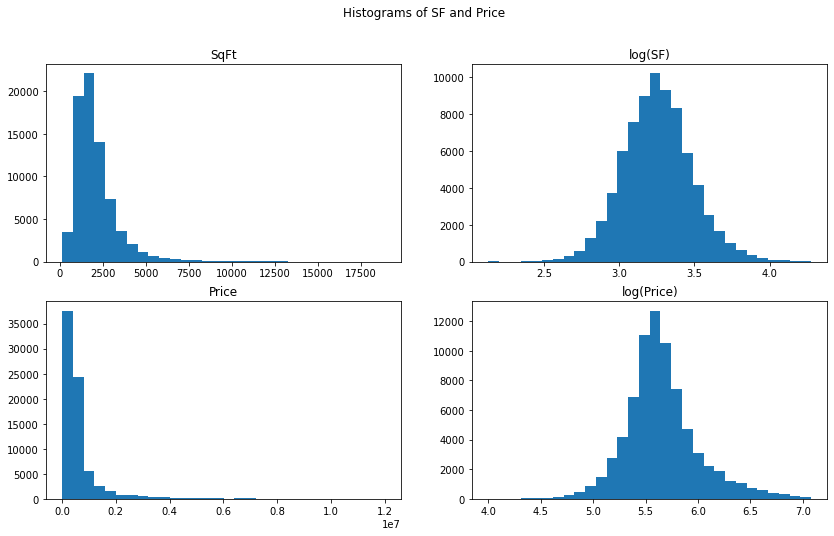

In [6]:
fig, ax = plt.subplots(2, 2, figsize=(14, 8))
fig.suptitle('Histograms of SF and Price')

ax[0,0].hist(x=RF.SF, bins=30);
ax[0,0].title.set_text('SqFt')
ax[0,1].hist(x=np.log10(RF.SF), bins=30);
ax[0,1].title.set_text('log(SF)')
ax[1,0].hist(x=RF.PRICE, bins=30);
ax[1,0].title.set_text('Price')
ax[1,1].hist(x=np.log10(RF.PRICE), bins=30);
ax[1,1].title.set_text('log(Price)')

In [7]:
px.scatter(data_frame=RF, x='SF', y='PRICE', color='Prop_Type', hover_name=RF.index, opacity=0.7, log_x=True, log_y=True)

In [8]:
features = np.log10(RF[['SF']])
y = np.log10(RF.PRICE)
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3, random_state=42)

In [9]:
lm = LinearRegression()
lm.fit(X_train, y_train)
lm.score(X_test, y_test)

0.43480394101075936

In [10]:
lm.intercept_, lm.coef_

(2.407205342789668, array([0.99781069]))

In [11]:
10**lm.intercept_ * (1500**(lm.coef_-1))

array([251.33438414])

In [12]:
Prop_Type_models = {}

for eachType in RF.Prop_Type.unique():
    X, y = RF[RF.Prop_Type==eachType][['SF']], RF[RF.Prop_Type==eachType].PRICE
    lm.fit(np.log10(X),np.log10(y))
    Prop_Type_models[eachType] = [lm.intercept_,lm.coef_[0]]

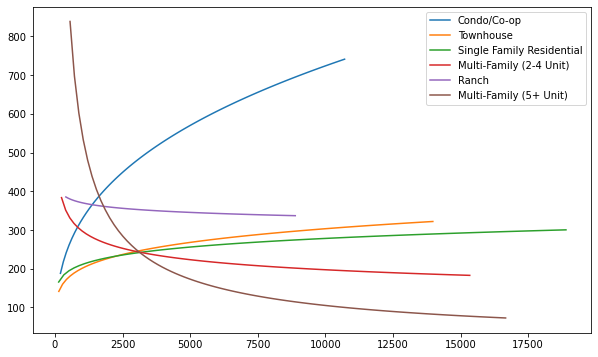

In [13]:
plt.figure(figsize = (10,6))
for eachType in RF.Prop_Type.unique():
    SF_range = np.linspace(RF[RF.Prop_Type==eachType].SF.min(),RF[RF.Prop_Type==eachType].SF.max(),100)
    prx_range = [10**Prop_Type_models[eachType][0] * (each_SF**(Prop_Type_models[eachType][1]-1)) for each_SF in SF_range]    
    plt.plot(SF_range, prx_range, label=eachType)
    plt.legend()

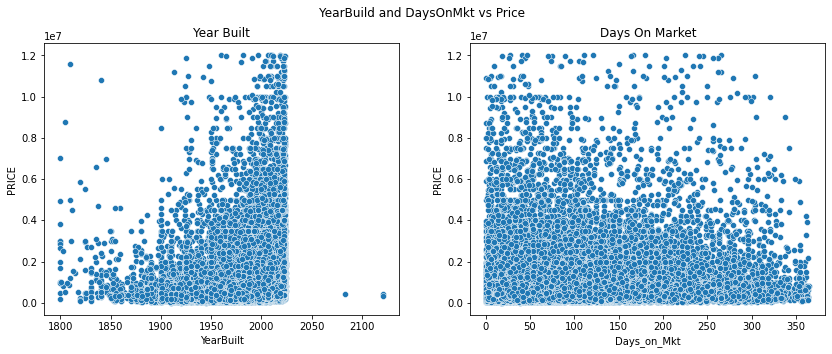

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('YearBuild and DaysOnMkt vs Price')

sns.scatterplot(ax=ax[0], x=RF.YearBuilt, y=RF.PRICE)
ax[0].title.set_text('Year Built')
sns.scatterplot(ax=ax[1], x=RF.Days_on_Mkt, y=RF.PRICE)
ax[1].title.set_text('Days On Market')

### 🎒 School Data

In [15]:
schools = get_schools()
schools.columns

----pulling schools data from Azure storage----
----Done----


Index(['name', 'street', 'city', 'zip', 'state', 'lat', 'long', 'districtID',
       'districtName', 'gradeLevels', 'ratingScale', 'enrollment',
       'schoolType', 'pctLowIncome', 'overallRating'],
      dtype='object')

In [16]:
print(schools.state.value_counts())
print('--------------------------')
print(schools.overallRating.unique())
print('--------------------------')

FL    14327
NC     9970
GA     6865
VA     6184
MD     4614
SC     3627
WV     1752
DC      630
Name: state, dtype: int64
--------------------------
[10.  8.  7.  6.  5.  4.  3. nan  2.  1.  9.]
--------------------------


In [17]:
zip_school_rating = schools.groupby('zip').agg("mean")['overallRating']

In [18]:
RF = RF.merge(zip_school_rating, how='left', left_on='zip', right_index=True)

<AxesSubplot:xlabel='overallRating', ylabel='PRICE'>

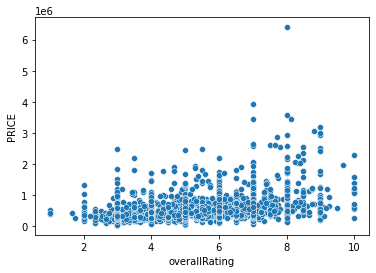

In [19]:
sns.scatterplot(x=RF.groupby('zip').agg('median').overallRating, y=RF.groupby('zip').agg('mean').PRICE)

In [ ]:
# Check Nan counts and fill
print(RF[['Lot_Size','YearBuilt','overallRating']].isna().sum())

RF_filler = RF.groupby(['zip','Prop_Type']).agg('mean')
RF_filler['sf_lot_ratio'] = RF_filler.SF / RF_filler.Lot_Size

In [ ]:
# For lot_size, determine sf to lot ratio per zip+Prop_Type
RF.loc[RF.Lot_Size.isna(),'Lot_Size'] = \
RF[RF.Lot_Size.isna()].apply(lambda r: r.SF / RF_filler.loc[(r.zip,r.Prop_Type),'sf_lot_ratio'], axis=1)
# Fill rest with 0
RF.loc[RF.Lot_Size.isna(),'Lot_Size'] = 0

In [ ]:
# For year built, use avg per zip+Prop_Type
RF.loc[RF.YearBuilt.isna(),'YearBuilt'] = \
RF[RF.YearBuilt.isna()].apply(lambda r: RF_filler.loc[(r.zip,r.Prop_Type),'YearBuilt'], axis=1)
# Fill rest with 1990
RF.loc[RF.YearBuilt.isna(),'YearBuilt'] = 1990

In [ ]:
print(RF[['Lot_Size','YearBuilt','overallRating']].isna().sum())

In [ ]:
RF.drop(RF[RF.BEDS.isna() | RF.BATHS.isna()].index, inplace=True)
RF.loc[RF.overallRating.isna(),'overallRating'] = 5

In [ ]:
features = RF[['Prop_Type','BEDS','BATHS','SF','Lot_Size','YearBuilt','overallRating','zip']]
features.zip = features.zip.astype('object')
y = np.log10(RF.PRICE)
features = pd.get_dummies(features, drop_first=True)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3)
lm = LinearRegression()
lm.fit(X_train, y_train)
print(f'train score: {lm.score(X_train, y_train)}')
print(f'test score: {lm.score(X_test, y_test)}')

## 🏥 look at Hospital data

In [33]:
hosp = pd.read_csv('Hospitals_geocoded.csv')
hosp = hosp[hosp.Overall_Rating>3]
hosp['lat_lon'] = list(zip(hosp.latitude, hosp.longitude))

In [35]:
RF = RF.merge(hosp.groupby('ZIP_Code').agg('count')['Facility_Name'], how='left', left_on='zip', right_index=True)
RF.rename(columns={'Facility_Name':'Hosp_count'}, inplace=True)

In [51]:
RF.loc[RF.Hosp_count.isna(),'Hosp_count'] = 0

In [52]:
RF.shape

(75360, 22)

In [ ]:
def calc_min_dist(home_lat_lon, place_series):
    '''
    calculates distances from home to all places,
    returns the min distance
    '''
    assert isinstance(place_series, pd.Series), "place_lat_lon must be a pd.Series"
    
    return place_series.apply(lambda x: geodesic(home_lat_lon,x).mi).min()

In [ ]:
RF['lat_lon'] = list(zip(RF.LATITUDE, RF.LONGITUDE))

## Do Not Run
-------------------------------

In [ ]:
RF['Dist_to_H'] = RF.lat_lon.apply(lambda x: calc_min_dist(x, hosp.lat_lon))

-------------------------------

#### Import Here Instead

In [ ]:
RF = pd.read_csv('C:/Users/dn-83/Documents/bootcamp/capstone_proj/_data/redfin_cleaned_stage_2.csv')

In [ ]:
sns.scatterplot(x=RF.Dist_to_H, y=RF.PRICE)

In [ ]:
lm = LinearRegression()
lm.fit(RF[['Dist_to_H']], np.log10(RF.PRICE))
lm.score(RF[['Dist_to_H']], np.log10(RF.PRICE))

## 💹 Model Try

In [2]:
RF = get_all()

----pulling Redfin data from Azure storage----
----Done----
----pulling schools data from Azure storage----
----Done----
----merging all data----
----Done----
Shape: (75360, 22)


In [3]:
print(RF.isna().sum())

Sale_Type            0
Sold_Date        75360
Prop_Type            0
ADDRESS              0
CITY                23
State                0
PRICE                0
BEDS               110
BATHS               47
LOCATION          1423
SF                   0
Lot_Size             0
YearBuilt            0
Days_on_Mkt       4091
px_perSF             0
HOA_perMonth     38876
STATUS               0
LATITUDE             0
LONGITUDE            0
zip                  0
overallRating     5361
Hosp_count           0
dtype: int64


In [4]:
RF.drop(RF[RF.BEDS.isna() | RF.BATHS.isna()].index, inplace=True)
RF.loc[RF.overallRating.isna(),'overallRating'] = 5

In [5]:
features = RF[['Prop_Type','BEDS','BATHS','SF','Lot_Size','YearBuilt','overallRating','zip','Hosp_count']]
features.zip = features.zip.astype('object')
y = np.log10(RF.PRICE)
features = pd.get_dummies(features, drop_first=True)

In [6]:
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3, random_state=42)
lm = LinearRegression()
lm.fit(X_train, y_train)
print(f'train score: {lm.score(X_train, y_train)}')
print(f'test score: {lm.score(X_test, y_test)}')

train score: 0.7607970116395318
test score: 0.6146460793764595
